In [1]:
import os
import pathlib
import pandas as pd
import numpy as np

import statsmodels.api as sm
import statsmodels.formula.api as smf

from scipy import stats
import matplotlib.pyplot as plt
from mplsoccer import PyPizza, FontManager

from itertools import combinations_with_replacement
from sklearn.preprocessing import OneHotEncoder
from xgboost import XGBClassifier


from joblib import load

In [2]:
PITCH_MAX_X = 105
PITCH_MAX_Y = 68
GOAL_WIDTH = 7.32

WYSCOUT_PITCH_MAX_X = 100
WYSCOUT_PITCH_MAX_Y = 100
WYSCOUT_BOX_X = 84
WYSCOUT_BOX_MIN_Y = 19
WYSCOUT_BOX_MAX_Y = 81

In [3]:
TRANSFORM_X = PITCH_MAX_X / WYSCOUT_PITCH_MAX_X
TRANSFORM_Y = PITCH_MAX_Y / WYSCOUT_PITCH_MAX_Y

BOX_X = WYSCOUT_BOX_X * TRANSFORM_X
BOX_MIN_Y = WYSCOUT_BOX_MIN_Y * TRANSFORM_Y
BOX_MAX_Y = WYSCOUT_BOX_MAX_Y * TRANSFORM_Y

In [4]:
TEAM = 'Chelsea'
DATA_PATH = os.path.join(str(pathlib.Path().resolve().parents[1]), 'data', 'Wyscout')
DATA_PATH

'C:\\Users\\Alvaro\\repos\\soccermatics\\data\\Wyscout'

In [5]:
leagues_names = {
    'England': 'Premier League',
    'France': 'Ligue 1',
    'Germany': 'Bundesliga',
    'Italy': 'Serie A',
    'Spain': 'LaLiga'
}

In [6]:
league = 'England'
league_name = leagues_names[league]

In [7]:
teams_file_name = 'teams.json'
teams_path = os.path.join(DATA_PATH, teams_file_name)

teams_df = pd.read_json(teams_path, encoding='unicode-escape')
teams_df.rename(columns = {'wyId': 'teamId'}, inplace=True)
teams_df[teams_df['name'] == TEAM]

,city,name,teamId,officialName,area,type
78,London,Chelsea,1610,Chelsea FC,"{'name': 'England', 'id': '0', 'alpha3code': '...",club


In [8]:
TEAM_ID = teams_df.loc[teams_df['name'] == 'Chelsea', 'teamId'].values[0]
TEAM_ID

1610

In [9]:
players_file_name = 'players.json'
players_path = os.path.join(DATA_PATH, players_file_name)

players_df = pd.read_json(players_path, encoding='unicode-escape')
players_df.rename(columns = {'wyId': 'playerId'}, inplace=True)
players_df['roleName'] = players_df['role'].apply(lambda x: x['name'])
players_df.head()

,passportArea,weight,firstName,middleName,lastName,currentTeamId,birthDate,height,role,birthArea,playerId,foot,shortName,currentNationalTeamId,roleName
0,"{'name': 'Turkey', 'id': '792', 'alpha3code': ...",78,Harun,,Tekin,4502,1989-06-17,187,"{'code2': 'GK', 'code3': 'GKP', 'name': 'Goalk...","{'name': 'Turkey', 'id': '792', 'alpha3code': ...",32777,right,H. Tekin,4687,Goalkeeper
1,"{'name': 'Senegal', 'id': '686', 'alpha3code':...",73,Malang,,Sarr,3775,1999-01-23,182,"{'code2': 'DF', 'code3': 'DEF', 'name': 'Defen...","{'name': 'France', 'id': '250', 'alpha3code': ...",393228,left,M. Sarr,4423,Defender
2,"{'name': 'France', 'id': '250', 'alpha3code': ...",72,Over,,Mandanda,3772,1998-10-26,176,"{'code2': 'GK', 'code3': 'GKP', 'name': 'Goalk...","{'name': 'France', 'id': '250', 'alpha3code': ...",393230,,O. Mandanda,null,Goalkeeper
3,"{'name': 'Senegal', 'id': '686', 'alpha3code':...",82,Alfred John Momar,,N'Diaye,683,1990-03-06,187,"{'code2': 'MD', 'code3': 'MID', 'name': 'Midfi...","{'name': 'France', 'id': '250', 'alpha3code': ...",32793,right,A. N'Diaye,19314,Midfielder
4,"{'name': 'France', 'id': '250', 'alpha3code': ...",84,Ibrahima,,Konaté,2975,1999-05-25,192,"{'code2': 'DF', 'code3': 'DEF', 'name': 'Defen...","{'name': 'France', 'id': '250', 'alpha3code': ...",393247,right,I. Konaté,null,Defender


In [10]:
# We can see players that move in the middle of the season (like Giroud from Arsenal to Chelsea) appear only once with last club
players_df[players_df.playerId == 26010]

,passportArea,weight,firstName,middleName,lastName,currentTeamId,birthDate,height,role,birthArea,playerId,foot,shortName,currentNationalTeamId,roleName
2035,"{'name': 'France', 'id': '250', 'alpha3code': ...",88,Olivier,,Giroud,1610,1986-09-30,192,"{'code2': 'FW', 'code3': 'FWD', 'name': 'Forwa...","{'name': 'France', 'id': '250', 'alpha3code': ...",26010,left,O. Giroud,4418,Forward


In [11]:
team_players = players_df[players_df['currentTeamId'] == TEAM_ID]
team_players

,passportArea,weight,firstName,middleName,lastName,currentTeamId,birthDate,height,role,birthArea,playerId,foot,shortName,currentNationalTeamId,roleName
212,"{'name': 'Spain', 'id': '724', 'alpha3code': '...",84,Kepa,,Arrizabalaga Revuelta,1610,1994-10-03,189,"{'code2': 'GK', 'code3': 'GKP', 'name': 'Goalk...","{'name': 'Spain', 'id': '724', 'alpha3code': '...",3397,right,Arrizabalaga,1598,Goalkeeper
272,"{'name': 'Spain', 'id': '724', 'alpha3code': '...",80,Wilfredo Daniel,,Caballero,1610,1981-09-28,186,"{'code2': 'GK', 'code3': 'GKP', 'name': 'Goalk...","{'name': 'Argentina', 'id': '32', 'alpha3code'...",3551,right,W. Caballero,12274,Goalkeeper
343,"{'name': 'Croatia', 'id': '191', 'alpha3code':...",77,Mateo,,Kovačić,1610,1994-05-06,178,"{'code2': 'MD', 'code3': 'MID', 'name': 'Midfi...","{'name': 'Austria', 'id': '40', 'alpha3code': ...",69404,right,M. Kovačić,9598,Midfielder
369,"{'name': 'Denmark', 'id': '208', 'alpha3code':...",78,Andreas,,Christensen,1610,1996-04-10,188,"{'code2': 'DF', 'code3': 'DEF', 'name': 'Defen...","{'name': 'Denmark', 'id': '208', 'alpha3code':...",135103,right,A. Christensen,7712,Defender
574,"{'name': 'Jamaica', 'id': '388', 'alpha3code':...",83,Ruben,,Loftus-Cheek,1610,1996-01-23,191,"{'code2': 'MD', 'code3': 'MID', 'name': 'Midfi...","{'name': 'England', 'id': '0', 'alpha3code': '...",235555,right,R. Loftus-Cheek,2413,Midfielder
611,"{'name': 'Brazil', 'id': '76', 'alpha3code': '...",75,Willian,,Borges da Silva,1610,1988-08-09,175,"{'code2': 'MD', 'code3': 'MID', 'name': 'Midfi...","{'name': 'Brazil', 'id': '76', 'alpha3code': '...",105333,right,Willian,6380,Midfielder
663,"{'name': 'England', 'id': '0', 'alpha3code': '...",86,Gary,,Cahill,1610,1985-12-19,193,"{'code2': 'DF', 'code3': 'DEF', 'name': 'Defen...","{'name': 'England', 'id': '0', 'alpha3code': '...",7887,right,G. Cahill,2413,Defender
741,"{'name': 'England', 'id': '0', 'alpha3code': '...",75,Victor,,Moses,1610,1990-12-12,177,"{'code2': 'MD', 'code3': 'MID', 'name': 'Midfi...","{'name': 'Nigeria', 'id': '566', 'alpha3code':...",8625,right,V. Moses,16823,Midfielder
996,"{'name': 'Sierra Leone', 'id': '694', 'alpha3c...",85,Antonio,,Rüdiger,1610,1993-03-03,191,"{'code2': 'DF', 'code3': 'DEF', 'name': 'Defen...","{'name': 'Germany', 'id': '276', 'alpha3code':...",14748,right,A. Rüdiger,3148,Defender
1940,"{'name': 'Spain', 'id': '724', 'alpha3code': '...",75,César,,Azpilicueta Tanco,1610,1989-08-28,178,"{'code2': 'DF', 'code3': 'DEF', 'name': 'Defen...","{'name': 'Spain', 'id': '724', 'alpha3code': '...",25553,right,Azpilicueta,1598,Defender


In [12]:
events_file_name = f'events_{league}.json'
events_path = os.path.join(DATA_PATH, 'events', events_file_name)

events_df = pd.read_json(events_path, encoding='unicode-escape')

# potential data collection error handling
events_df = events_df.loc[events_df.apply (lambda x: len(x.positions) == 2, axis = 1)]

In [13]:
def transform_x(row, i):
    return row[i]['x'] * TRANSFORM_X

def transform_y(row, i):
    return (WYSCOUT_PITCH_MAX_Y - row[i]['y']) * TRANSFORM_Y

events_df["x"] = events_df.positions.apply(lambda row: transform_x(row, 0))
events_df["y"] = events_df.positions.apply(lambda row: transform_y(row, 0))
events_df["end_x"] = events_df.positions.apply(lambda row: transform_x(row, 1))
events_df["end_y"] = events_df.positions.apply(lambda row: transform_y(row, 1))
events_df

,eventId,subEventName,tags,playerId,positions,matchId,eventName,teamId,matchPeriod,eventSec,subEventId,id,x,y,end_x,end_y
0,8,Simple pass,[{'id': 1801}],25413,"[{'y': 49, 'x': 49}, {'y': 78, 'x': 31}]",2499719,Pass,1609,1H,2.758649,85,177959171,51.45,34.68,32.55,14.96
1,8,High pass,[{'id': 1801}],370224,"[{'y': 78, 'x': 31}, {'y': 75, 'x': 51}]",2499719,Pass,1609,1H,4.946850,83,177959172,32.55,14.96,53.55,17.00
2,8,Head pass,[{'id': 1801}],3319,"[{'y': 75, 'x': 51}, {'y': 71, 'x': 35}]",2499719,Pass,1609,1H,6.542188,82,177959173,53.55,17.00,36.75,19.72
3,8,Head pass,[{'id': 1801}],120339,"[{'y': 71, 'x': 35}, {'y': 95, 'x': 41}]",2499719,Pass,1609,1H,8.143395,82,177959174,36.75,19.72,43.05,3.40
4,8,Simple pass,[{'id': 1801}],167145,"[{'y': 95, 'x': 41}, {'y': 88, 'x': 72}]",2499719,Pass,1609,1H,10.302366,85,177959175,43.05,3.40,75.60,8.16
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
643145,5,Ball out of the field,[],0,"[{'y': 32, 'x': 0}, {'y': 100, 'x': 100}]",2500098,Interruption,1623,2H,2796.732525,50,251596409,0.00,46.24,105.00,0.00
643146,3,Corner,"[{'id': 302}, {'id': 801}, {'id': 1801}]",70965,"[{'y': 100, 'x': 100}, {'y': 47, 'x': 88}]",2500098,Free Kick,1633,2H,2829.821084,30,251596232,105.00,0.00,92.40,36.04
643147,1,Air duel,"[{'id': 701}, {'id': 1802}]",7919,"[{'y': 53, 'x': 12}, {'y': 50, 'x': 14}]",2500098,Duel,1623,2H,2831.211419,10,251596410,12.60,31.96,14.70,34.00
643148,1,Air duel,"[{'id': 703}, {'id': 1801}]",8005,"[{'y': 47, 'x': 88}, {'y': 50, 'x': 86}]",2500098,Duel,1633,2H,2832.434399,10,251596234,92.40,36.04,90.30,34.00


In [14]:
minutes_path = os.path.join(DATA_PATH, 'minutes_played', f'minutes_played_per_game_{league}.json')
minutes_per_game = pd.read_json(minutes_path, encoding='unicode-escape')
minutes_per_player = minutes_per_game.groupby(["playerId", "teamId"]).minutesPlayed.sum().reset_index()
minutes_per_player.head()

,playerId,teamId,minutesPlayed
0,36,1624,1238
1,38,1611,382
2,48,1624,3343
3,54,1624,3348
4,56,1623,266


In [15]:
def calculate_distance_and_angle(x, y):
    c = abs(y - PITCH_MAX_Y / 2)
    d = PITCH_MAX_X - x
    distance = np.sqrt(d ** 2 + c ** 2)
    angle = np.arctan((GOAL_WIDTH * d) / (d ** 2 + c ** 2 - (GOAL_WIDTH / 2) ** 2))
    angle = angle + np.pi * (angle <= 0)
    
    return distance, angle


def predict_xG(distance, angle, model):
    params = model.params
    return 1 / (1 + np.exp(params[0] + params[1] * distance + params[2] * angle))

In [16]:
def build_xG_df(shots):
    # calculate distance and angle 
    shots["distance"], shots["angle"] = zip(*shots.apply(lambda row: calculate_distance_and_angle(row["x"], row["y"]), axis=1))
    
    # headers have id = 403
    headers = shots.loc[shots.apply (lambda x: {'id': 403} in x.tags, axis = 1)]
    non_headers = shots.drop(headers.index)
    
    return headers, non_headers


def predict_xG_df(shots):
    headers, non_headers = build_xG_df(shots)
    
    headers_path_model = os.path.join(str(pathlib.Path().resolve().parents[1]), 'models', 'headers_xG_model.sav')
    headers_model = load(headers_path_model)
    
    non_headers_path_model = os.path.join(str(pathlib.Path().resolve().parents[1]), 'models', 'non_headers_xG_model.sav')
    non_headers_model = load(non_headers_path_model)

    headers = headers.assign(xG=headers.apply(lambda row: predict_xG(row['distance'], row['angle'], headers_model), axis=1))
    non_headers = non_headers.assign(xG=non_headers.apply(lambda row: predict_xG(row['distance'], row['angle'], non_headers_model), axis=1))
    
    all_shots_xg = pd.concat([non_headers, headers])
    
    return all_shots_xg.sort_index()
    

def calulatePlayerxGShots(df, npxG = False):
    """
    Parameters
    ----------
    df : dataframe
        dataframe with Wyscout event data.
    npxG : boolean
        True if xG should not include penalties, False elsewhere.

    Returns
    -------
    xG_sum: dataframe
        dataframe with sum of Expected Goals for players during the season.

    """   
    # very basic xG model based on 
    shots = df.loc[df["eventName"] == "Shot"].copy()
    
    all_shots_xg = predict_xG_df(shots)
        
    if npxG == False:
        # find pens
        penalties = df[df["subEventName"] == "Penalty"]
        # assign 0.8
        penalties = penalties.assign(xG=0.8)
        # concat, group and sum
        all_shots_xg = pd.concat([all_shots_xg["playerId", "teamId", "xG"], penalties[["playerId", "teamId", "xG"]]])
        xG_sum = all_shots_xg.groupby(["playerId", "teamId"])["xG"].sum().sort_values(ascending=False).reset_index()
    else:
        # concat, group and sum
        all_shots_xg = all_shots_xg[["playerId", "teamId", "xG"]]
        all_shots_xg.rename(columns = {"xG": "npxG"}, inplace=True)
        xG_sum = all_shots_xg.groupby(["playerId", "teamId"])["npxG"].sum().sort_values(ascending=False).reset_index()
    
    non_penalties_shots = shots[df["subEventName"] != "Penalty"]
    shots_player = non_penalties_shots.groupby(["playerId", "teamId"]).size().reset_index(name="shots")
    shots_and_xG = xG_sum.merge(shots_player, how="outer", on=["playerId", "teamId"])
    
    return shots_and_xG


npxg = calulatePlayerxGShots(events_df, npxG = True)
npxg.head()

,playerId,teamId,npxG,shots
0,8717,1624,22.438968,162
1,120353,1612,17.389515,136
2,11066,1625,14.561597,79
3,7905,1611,13.526461,76
4,8325,1625,12.921184,86


In [17]:
def calculatePlayerWonDuels(df):
    """
    Parameters
    ----------
    df : dataframe
        dataframe with Wyscout event data.

    Returns
    -------
    duels_won: dataframe
        dataframe with number of won air and ground duels for a player 

    """
    # find air duels
    air_duels = df.loc[df["subEventName"] == "Air duel"]
    
    # 703 is the id of a won duel
    won_air_duels = air_duels.loc[air_duels.apply (lambda x:{'id':703} in x.tags, axis = 1)]
    won_air_duels_in_box = won_air_duels[(won_air_duels["x"] > BOX_X) & 
                                         (won_air_duels["y"] > BOX_MIN_Y) & (won_air_duels["y"] < BOX_MAX_Y)]
    
    # group and sum air duels
    wad_player =  won_air_duels_in_box.groupby(["playerId", "teamId"]).size().reset_index(name="airDuelsWon")
    
    #find ground duels won
    ground_duels = df.loc[df["subEventName"] == "Ground attacking duel"]
    won_ground_duels = ground_duels.loc[ground_duels.apply (lambda x:{'id':703} in x.tags, axis = 1)]
    
    wgd_player =  won_ground_duels.groupby(["playerId", "teamId"]).size().reset_index(name="groundDuelsWon")
    
    #outer join
    duels_won = wgd_player.merge(wad_player, how="outer", on=["playerId", "teamId"])
    
    # remove playerId = 0 used when the player cannot be identified
    return duels_won[duels_won.playerId != 0]


duels = calculatePlayerWonDuels(events_df)
duels

,playerId,teamId,groundDuelsWon,airDuelsWon
20,36,1624,13.0,2.0
21,38,1611,7.0,1.0
22,48,1624,50.0,9.0
23,54,1624,102.0,1.0
24,56,1623,7.0,NaN
...,...,...,...,...
503,13451,1651,NaN,4.0
504,15301,1651,NaN,1.0
505,25885,1644,NaN,2.0
506,61979,10531,NaN,3.0


In [18]:
def calculatePlayerGoals(df):
    """
    Parameters
    ----------
    df : dataframe
        dataframe with Wyscout event data.

    Returns
    -------
    data: dataframe
        dataframe with number of (non-penalty) goals.

    """
    # get goals
    shots = df[df["subEventName"] == "Shot"]
    goals = shots.loc[shots.apply (lambda x:{'id':101} in x.tags, axis=1)]
    
    # goals by player
    g_player =  goals.groupby(["playerId", "teamId"]).size().reset_index(name="goals")
    
    return g_player


gakp = calculatePlayerGoals(events_df)
gakp.head()

,playerId,teamId,goals
0,54,1624,10
1,74,1612,1
2,93,1646,2
3,116,1612,1
4,120,1651,1


In [19]:
chains_file_name = f'possession_chains_{league}.json'
chains_path = os.path.join(DATA_PATH, 'possession_chain', chains_file_name)

chains_df = pd.read_json(chains_path, encoding='unicode-escape')

chains_df.rename(columns={'xG': 'xG_final_shot'}, inplace=True)

In [20]:
def build_vars(df, var=["x0", "x1", "c0", "c1"]):
    new_vars = var.copy()
    
    for r in range(1, 4):
        for combo in combinations_with_replacement(var, r):
            if len(combo) > 1:
                col_name = "".join(combo)
                df[col_name] = df[list(combo)].product(axis=1)
                new_vars.append(col_name)
    
    return df, new_vars

In [21]:
def predict_xShot_df(df, var):
    xT_actions = chains_df.loc[(chains_df["eventName"] == "Pass") | (chains_df["subEventName"] == "Ground attacking duel")].copy()

    encoder = OneHotEncoder(sparse_output=False, drop='first')
    cat_cols_encoded = encoder.fit_transform(xT_actions['subEventName'].values.reshape(-1, 1))
    
    X = np.hstack((xT_actions[var].values, cat_cols_encoded))

    # path to saved model
    path_model = os.path.join(str(pathlib.Path().resolve().parents[1]), 'models', 'xShot_cls_model.sav')
    model = load(path_model) 

    # predict probability of shot ended
    y_pred_proba = model.predict_proba(X)[:, 1]

    xT_actions["shotProb"] = y_pred_proba
    
    return xT_actions
    

def calulatePlayerxTxA(df):
    """
    Parameters
    ----------
    df : dataframe
        dataframe with Wyscout event data with chains.

    Returns
    -------
    xG_sum: dataframe
        dataframe with sum of Expected Threat and Expected Assists for players during the season.

    """
    df, var = build_vars(df)
    
    xT_actions = predict_xShot_df(df, var)
    
    xT_actions["x"] = xT_actions.positions.apply(lambda row: transform_x(row, 1))
    xT_actions["y"] = xT_actions.positions.apply(lambda row: transform_y(row, 1))
    
    xT_actions = predict_xG_df(xT_actions)
    
    # calculate xT
    xT = xT_actions["xG"] * xT_actions["shotProb"]
    xT_actions["xT"] = xT
    
    xT_sum = xT_actions.groupby(["playerId", "teamId"])["xT"].sum().sort_values(ascending=False).reset_index()
    
    
    def find_shot_assists(group):
        last_event = group.iloc[-1]
        if last_event['eventName'] == 'Shot' and len(group) >= 2 and group.iloc[-2]['eventName'] == 'Pass':
            return group.iloc[-2]

    xA_actions = df.groupby('possession_chain').apply(find_shot_assists).reset_index(drop=True).dropna()
    xA_sum = xA_actions.groupby(["playerId", "teamId"])["xG_final_shot"].sum().sort_values(ascending=False).reset_index()
    xA_sum.rename(columns={'xG_final_shot': 'xA'}, inplace=True)
    
    xT_xA_sum = xT_sum.merge(xA_sum, how="outer", on=["playerId", "teamId"])
    
    return xT_xA_sum


player_xT = calulatePlayerxTxA(chains_df)
player_xT

,playerId,teamId,xT,xA
0,38021,1625,52.369799,8.074835
1,25707,1610,39.984395,4.395749
2,54,1624,38.790975,5.475425
3,8422,1628,36.252628,4.872200
4,11066,1625,35.650561,4.659790
...,...,...,...,...
541,15301,1651,0.000458,NaN
542,447538,1619,0.000450,NaN
543,415747,1659,0.000122,NaN
544,134708,1612,0.000085,NaN


In [22]:
merge_cols = ["playerId", "teamId"]

summary = events_df[["playerId", "teamId"]].drop_duplicates()
summary = summary.merge(npxg, how = "left", on=merge_cols).merge(player_xT, how="left", on=merge_cols).merge(duels, how="left", on=merge_cols).merge(gakp, how="left", on=merge_cols)
summary["goals-npxG"] = summary["goals"] - summary["npxG"]
summary["npxGPerShot"] = summary["npxG"] / summary["shots"]

summary = summary.merge(minutes_per_player, how="right", on=merge_cols)
summary = summary.fillna(0)
summary = summary.loc[summary["minutesPlayed"] > 400]
summary

,playerId,teamId,npxG,shots,xT,xA,groundDuelsWon,airDuelsWon,goals,goals-npxG,npxGPerShot,minutesPlayed
0,36,1624,0.603773,10.0,3.682791,0.412313,13.0,2.0,0.0,0.000000,0.060377,1238
2,48,1624,1.264307,23.0,7.893724,0.319326,50.0,9.0,0.0,0.000000,0.054970,3343
3,54,1624,6.496268,80.0,38.790975,5.475425,102.0,1.0,10.0,3.503732,0.081203,3348
5,74,1612,0.448841,2.0,3.492580,0.177152,14.0,1.0,1.0,0.551159,0.224420,1514
6,93,1646,3.462889,50.0,21.953309,2.079812,141.0,6.0,2.0,-1.462889,0.069258,2942
...,...,...,...,...,...,...,...,...,...,...,...,...
505,397178,1611,4.850707,54.0,20.089825,1.861427,119.0,3.0,7.0,2.149293,0.089828,1904
514,419784,1631,0.035497,2.0,0.677215,0.000000,6.0,0.0,0.0,0.000000,0.017749,405
516,434159,1627,1.110135,5.0,1.770559,0.084641,10.0,0.0,1.0,-0.110135,0.222027,561
522,447812,1639,0.014003,1.0,2.864759,0.245139,14.0,0.0,0.0,0.000000,0.014003,499


In [23]:
to_merge = players_df[["playerId", "shortName", "roleName"]]
summary = summary.merge(to_merge, how="inner", on=["playerId"])  # as players aren't duplicated in both teams they played
summary = summary.merge(teams_df[["teamId", "name"]], how="inner", on=["teamId"])
summary = summary.rename(columns={"name": "teamName"})
summary

,playerId,teamId,npxG,shots,xT,xA,groundDuelsWon,airDuelsWon,goals,goals-npxG,npxGPerShot,minutesPlayed,shortName,roleName,teamName
0,36,1624,0.603773,10.0,3.682791,0.412313,13.0,2.0,0.0,0.000000,0.060377,1238,T. Alderweireld,Defender,Tottenham Hotspur
1,48,1624,1.264307,23.0,7.893724,0.319326,50.0,9.0,0.0,0.000000,0.054970,3343,J. Vertonghen,Defender,Tottenham Hotspur
2,54,1624,6.496268,80.0,38.790975,5.475425,102.0,1.0,10.0,3.503732,0.081203,3348,C. Eriksen,Midfielder,Tottenham Hotspur
3,8292,1624,0.684597,8.0,9.211378,0.469822,52.0,1.0,0.0,0.000000,0.085575,838,D. Rose,Defender,Tottenham Hotspur
4,8717,1624,22.438968,162.0,21.280035,1.829275,191.0,23.0,27.0,4.561032,0.138512,3201,H. Kane,Forward,Tottenham Hotspur
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
398,134502,1625,0.094389,3.0,1.803826,0.248651,7.0,0.0,0.0,0.000000,0.031463,835,A. Laporte,Defender,Manchester City
399,241564,1625,0.099734,5.0,3.868182,0.254544,6.0,0.0,0.0,0.000000,0.019947,549,O. Zinchenko,Midfielder,Manchester City
400,245364,1625,4.569438,48.0,30.679446,5.886953,184.0,1.0,10.0,5.430562,0.095197,2521,L. Sané,Midfielder,Manchester City
401,265673,1625,3.281312,23.0,18.679562,1.900767,106.0,2.0,6.0,2.718688,0.142666,1623,Bernardo Silva,Midfielder,Manchester City


In [24]:
summary_per_90 = summary[["playerId", "shortName", "teamId", "teamName", "roleName"]].copy()
for column in summary.columns[3:-4]:
    summary_per_90[column + "_per90"] = summary.apply(lambda x: x[column] * 90 / x["minutesPlayed"], axis = 1)

summary_per_90

,playerId,shortName,teamId,teamName,roleName,shots_per90,xT_per90,xA_per90,groundDuelsWon_per90,airDuelsWon_per90,goals_per90,goals-npxG_per90,npxGPerShot_per90
0,36,T. Alderweireld,1624,Tottenham Hotspur,Defender,0.726979,0.267731,0.029974,0.945073,0.145396,0.000000,0.000000,0.004389
1,48,J. Vertonghen,1624,Tottenham Hotspur,Defender,0.619204,0.212514,0.008597,1.346096,0.242297,0.000000,0.000000,0.001480
2,54,C. Eriksen,1624,Tottenham Hotspur,Midfielder,2.150538,1.042768,0.147189,2.741935,0.026882,0.268817,0.094186,0.002183
3,8292,D. Rose,1624,Tottenham Hotspur,Defender,0.859189,0.989289,0.050458,5.584726,0.107399,0.000000,0.000000,0.009191
4,8717,H. Kane,1624,Tottenham Hotspur,Forward,4.554827,0.598314,0.051432,5.370197,0.646673,0.759138,0.128239,0.003894
...,...,...,...,...,...,...,...,...,...,...,...,...,...
398,134502,A. Laporte,1625,Manchester City,Defender,0.323353,0.194424,0.026801,0.754491,0.000000,0.000000,0.000000,0.003391
399,241564,O. Zinchenko,1625,Manchester City,Midfielder,0.819672,0.634128,0.041729,0.983607,0.000000,0.000000,0.000000,0.003270
400,245364,L. Sané,1625,Manchester City,Midfielder,1.713606,1.095260,0.210165,6.568822,0.035700,0.357001,0.193872,0.003399
401,265673,Bernardo Silva,1625,Manchester City,Midfielder,1.275416,1.035835,0.105403,5.878004,0.110906,0.332717,0.150759,0.007911


In [25]:
# If England check Giroud
# summary_per_90[summary_per_90.playerId == 26010]

In [26]:
possession_file_name = f'player_possession_{league}.json'
possession_path = os.path.join(DATA_PATH, 'player_possession', possession_file_name)

possession_df = pd.read_json(possession_path, encoding='unicode-escape')
possession_df

,playerId,teamId,possession
0,9206,1646,0.446999
1,9127,1646,0.439018
2,93,1646,0.438288
3,9179,1646,0.471322
4,10108,1646,0.433335
...,...,...,...
524,297258,1628,0.305936
525,227756,1610,0.699029
526,20450,1639,0.380787
527,447254,1627,0.364312


In [27]:
summary_per_90 = summary_per_90.merge(possession_df, how="left", on=merge_cols)
summary_per_90.head()

,playerId,shortName,teamId,teamName,roleName,shots_per90,xT_per90,xA_per90,groundDuelsWon_per90,airDuelsWon_per90,goals_per90,goals-npxG_per90,npxGPerShot_per90,possession
0,36,T. Alderweireld,1624,Tottenham Hotspur,Defender,0.726979,0.267731,0.029974,0.945073,0.145396,0.000000,0.000000,0.004389,0.597434
1,48,J. Vertonghen,1624,Tottenham Hotspur,Defender,0.619204,0.212514,0.008597,1.346096,0.242297,0.000000,0.000000,0.001480,0.597295
2,54,C. Eriksen,1624,Tottenham Hotspur,Midfielder,2.150538,1.042768,0.147189,2.741935,0.026882,0.268817,0.094186,0.002183,0.606674
3,8292,D. Rose,1624,Tottenham Hotspur,Defender,0.859189,0.989289,0.050458,5.584726,0.107399,0.000000,0.000000,0.009191,0.617662
4,8717,H. Kane,1624,Tottenham Hotspur,Forward,4.554827,0.598314,0.051432,5.370197,0.646673,0.759138,0.128239,0.003894,0.604725


In [28]:
summary_per_90.columns[5:-1]

Index(['shots_per90', 'xT_per90', 'xA_per90', 'groundDuelsWon_per90',
       'airDuelsWon_per90', 'goals_per90', 'goals-npxG_per90',
       'npxGPerShot_per90'],
      dtype='object')

In [29]:
# adjust for possession
summary_adjusted = summary[["playerId", "shortName", "teamId", "teamName", "roleName"]].copy()
for column in summary_per_90.columns[5:-1]:
    summary_adjusted[column + "_adjusted"] = summary_per_90.apply(lambda x: x[column] / x["possession"], axis = 1)

summary_adjusted

,playerId,shortName,teamId,teamName,roleName,shots_per90_adjusted,xT_per90_adjusted,xA_per90_adjusted,groundDuelsWon_per90_adjusted,airDuelsWon_per90_adjusted,goals_per90_adjusted,goals-npxG_per90_adjusted,npxGPerShot_per90_adjusted
0,36,T. Alderweireld,1624,Tottenham Hotspur,Defender,1.216835,0.448135,0.050172,1.581886,0.243367,0.000000,0.000000,0.007347
1,48,J. Vertonghen,1624,Tottenham Hotspur,Defender,1.036680,0.355794,0.014393,2.253652,0.405657,0.000000,0.000000,0.002478
2,54,C. Eriksen,1624,Tottenham Hotspur,Midfielder,3.544800,1.718828,0.242616,4.519621,0.044310,0.443100,0.155250,0.003598
3,8292,D. Rose,1624,Tottenham Hotspur,Defender,1.391034,1.601668,0.081692,9.041721,0.173879,0.000000,0.000000,0.014880
4,8717,H. Kane,1624,Tottenham Hotspur,Forward,7.532064,0.989399,0.085051,8.880397,1.069367,1.255344,0.212062,0.006440
...,...,...,...,...,...,...,...,...,...,...,...,...,...
398,134502,A. Laporte,1625,Manchester City,Defender,0.458580,0.275733,0.038009,1.070019,0.000000,0.000000,0.000000,0.004809
399,241564,O. Zinchenko,1625,Manchester City,Midfielder,1.145221,0.885985,0.058302,1.374265,0.000000,0.000000,0.000000,0.004569
400,245364,L. Sané,1625,Manchester City,Midfielder,2.497440,1.596251,0.306298,9.573518,0.052030,0.520300,0.282552,0.004953
401,265673,Bernardo Silva,1625,Manchester City,Midfielder,1.829030,1.485456,0.151155,8.429445,0.159046,0.477138,0.216198,0.011345


In [30]:
def plotPlayerPizza(player_adjusted, role_summary_adjusted):
    plot_cols = ["goals-npxG_per90_adjusted", "npxGPerShot_per90_adjusted", "xA_per90_adjusted", "xT_per90_adjusted", "groundDuelsWon_per90_adjusted", "airDuelsWon_per90_adjusted"]
    player_adjusted_plot = player_adjusted[plot_cols]
    # take only necessary columns
    adjusted_columns = player_adjusted_plot.columns[:]
    if len(player_adjusted_plot) > 1:
        percentiles = [int(stats.percentileofscore(role_summary_adjusted[column], player_adjusted_plot[column].iloc[1])) for column in adjusted_columns]
        params_offset = [
            False, False, False, True, False, True
        ]
        team_name = player_adjusted['teamName'].values[1]
    else:
        percentiles = None
        params_offset = None
        
    # percentiles
    percentiles_2 = [int(stats.percentileofscore(role_summary_adjusted[column], player_adjusted_plot[column].iloc[0])) for column in adjusted_columns]
    names = ["np Goals - xG", "np xG / Shot", "xA", "xT", "Offensive Ground Duels Won", "In-Box Air Duels Won"]

    slice_colors = ["#F16017"] * 2 + ["#EE0F34"] * 2 + ["#5E11E4"] * 2
    compare_slice_colors = ["#F1B31A"] * 2 + ["#EDA4A4"] * 2 + ["#D2B2E8"] * 2
    text_colors = ["white"] * len(plot_cols)

    font_normal = FontManager(("https://github.com/google/fonts/blob/main/apache/roboto/"
                               "Roboto%5Bwdth,wght%5D.ttf?raw=true"))
    font_italic = FontManager(("https://github.com/google/fonts/blob/main/apache/roboto/"
                               "Roboto-Italic%5Bwdth,wght%5D.ttf?raw=true"))
    font_bold = FontManager(("https://github.com/google/fonts/blob/main/apache/robotoslab/"
                             "RobotoSlab%5Bwght%5D.ttf?raw=true"))

    baker = PyPizza(
        params=names,                  # list of parameters
        background_color="#EBEBE9",     # background color
        straight_line_color="#000000",  # color for straight lines
        straight_line_lw=1,             # linewidth for straight lines
        last_circle_lw=1,               # linewidth of last circle
        other_circle_lw=1,              # linewidth for other circles
        other_circle_ls="-."            # linestyle for other circles
    )

    fig, ax = baker.make_pizza(
        percentiles_2,              # list of values
        compare_values=percentiles,  # comparison values
        figsize=(10, 10),      # adjust figsize according to your need
        param_location=110,
        slice_colors=slice_colors,
        compare_colors=compare_slice_colors,
        # color_blank_space="same",
        value_colors=text_colors,
        compare_value_colors=text_colors,
        value_bck_colors=slice_colors,  # value background color
        compare_value_bck_colors=compare_slice_colors,
        blank_alpha=0.1,                 # alpha for blank-space colors
        # where the parameters will be added
        kwargs_slices=dict(
            facecolor="cornflowerblue", edgecolor="#000000",
            zorder=2, linewidth=1
        ),                   # values to be used when plotting slices
        kwargs_compare=dict(
            facecolor="cornflowerblue", edgecolor="#000000",
            zorder=2, linewidth=1
        ),    
        kwargs_params=dict(
            color="#000000", fontsize=12,
            fontproperties=font_normal.prop, va="center"
        ),                   # values to be used when adding parameter
        kwargs_values=dict(
            color="#000000", fontsize=12,
            fontproperties=font_normal.prop, zorder=3,
            bbox=dict(
                edgecolor="#000000", facecolor="cornflowerblue",
                boxstyle="round,pad=0.2", lw=1
            )
        ),                    # values to be used when adding parameter-values
        kwargs_compare_values=dict(
            color="#000000", fontsize=12,
            fontproperties=font_normal.prop, zorder=3,
            bbox=dict(
                edgecolor="#000000", facecolor="cornflowerblue",
                boxstyle="round,pad=0.2", lw=1
            )
        )                    # values to be used when adding parameter-values
    )
    
    if len(player_adjusted_plot) > 1:
        baker.adjust_texts(params_offset, offset=-0.17, adj_comp_values=True)
        
    # add title
    player_name = player_adjusted['shortName'].values[0]
    team_name_2 = player_adjusted['teamName'].values[0]
    
    
    if len(player_adjusted_plot) > 1:
        title = f"{player_name} per 90 (possession adjusted)"
    else:
        title = f"{player_name} per 90 (possession adjusted) - {team_name_2}"
        
    fig.text(
        0.515, 0.97, 
        title, 
        size=18, ha="center", fontproperties=font_bold.prop, color="#000000"
    )
    
    # add subtitle
    fig.text(
        0.515, 0.942,
        f"Percentile Rank vs {league_name} Forwards | Season 2017-18",  ## !
        size=15,
        ha="center", fontproperties=font_bold.prop, color="#000000"
    )
    
    
    if len(player_adjusted_plot) > 1: 
        # add text
        fig.text(
            0.15, 0.91, f"{team_name_2}", size=14,
            fontproperties=font_bold.prop, color="#000000"
        )
        fig.text(
            0.77, 0.91, f"{team_name}", size=14,
            fontproperties=font_bold.prop, color="#000000"
        )

        x_pos = 0.17
        x_sep = 0.05
        y_pos = 0.88
        # add rectangles
        fig.patches.extend([
            plt.Rectangle(
                (x_pos - x_sep, y_pos), 0.025, 0.021, fill=True, color=slice_colors[0],
                transform=fig.transFigure, figure=fig
            ),
            plt.Rectangle(
                (x_pos, y_pos), 0.025, 0.021, fill=True, color=slice_colors[2],
                transform=fig.transFigure, figure=fig
            ),
            plt.Rectangle(
                (x_pos + x_sep, y_pos), 0.025, 0.021, fill=True, color=slice_colors[4],
                transform=fig.transFigure, figure=fig
            ),

            plt.Rectangle(
                ((0.96 - x_pos) - x_sep, y_pos), 0.025, 0.021, fill=True, color=compare_slice_colors[0],
                transform=fig.transFigure, figure=fig
            ),
            plt.Rectangle(
                ((0.96 - x_pos), y_pos), 0.025, 0.021, fill=True, color=compare_slice_colors[2],
                transform=fig.transFigure, figure=fig
            ),
            plt.Rectangle(
                ((0.96 - x_pos) + x_sep, y_pos), 0.025, 0.021, fill=True, color=compare_slice_colors[4],
                transform=fig.transFigure, figure=fig
            ),
        ])
    
    plt.savefig(f"img/{league}/{player_name}_{team_name_2}.png")
    plt.show()

In [31]:
roles = players_df.roleName.unique()
role = roles[3]
role

'Forward'

In [32]:
role_summary_adjusted = summary_adjusted[summary_adjusted["roleName"] == role]
role_summary_adjusted_w_birthdate = pd.merge(role_summary_adjusted, players_df[['playerId', 'birthDate', 'height']], on='playerId')
role_summary_adjusted_w_birthdate['birthDate'] = pd.to_datetime(role_summary_adjusted_w_birthdate['birthDate'])
august_2018 = pd.to_datetime('2018-08-01')
role_summary_adjusted_w_birthdate['age'] = (august_2018 - role_summary_adjusted_w_birthdate['birthDate']).dt.days // 365

role_summary_adjusted_w_birthdate

,playerId,shortName,teamId,teamName,roleName,shots_per90_adjusted,xT_per90_adjusted,xA_per90_adjusted,groundDuelsWon_per90_adjusted,airDuelsWon_per90_adjusted,goals_per90_adjusted,goals-npxG_per90_adjusted,npxGPerShot_per90_adjusted,birthDate,height,age
0,8717,H. Kane,1624,Tottenham Hotspur,Forward,7.532064,0.989399,0.085051,8.880397,1.069367,1.255344,0.212062,0.006440,1993-07-28,188,25
1,14911,Son Heung-Min,1624,Tottenham Hotspur,Forward,4.318001,1.614583,0.246184,11.041746,0.061686,0.740229,0.318201,0.006029,1992-07-08,183,26
2,3802,Philippe Coutinho,1612,Liverpool,Forward,5.666816,2.074502,0.276798,15.111508,0.134924,0.674621,0.356010,0.007586,1992-06-12,171,26
3,7907,D. Sturridge,1612,Liverpool,Forward,6.665465,1.270859,0.126618,12.061317,0.000000,0.634806,-0.088183,0.034428,1989-09-01,180,28
4,15808,Roberto Firmino,1612,Liverpool,Forward,4.228967,1.487623,0.208475,8.136747,0.642375,0.749437,0.328922,0.005323,1991-10-02,181,26
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
73,134351,B. Afobe,1659,AFC Bournemouth,Forward,2.178957,0.697000,0.013330,8.715826,0.622559,0.000000,0.000000,0.078301,1993-02-12,183,25
74,245813,L. Mousset,1659,AFC Bournemouth,Forward,5.169473,1.123564,0.055682,15.508420,0.544155,0.544155,0.157373,0.020357,1996-02-08,184,22
75,8325,S. Agüero,1625,Manchester City,Forward,5.508474,1.083092,0.294404,9.607803,0.512416,1.088884,0.261256,0.009624,1988-06-02,173,30
76,11066,R. Sterling,1625,Manchester City,Forward,3.800866,1.715228,0.224193,10.344129,0.048112,0.817908,0.117317,0.008868,1994-12-08,170,23


In [33]:
# Filter and order by players we want to scout
role_summary_adjusted_w_birthdate[role_summary_adjusted_w_birthdate.age <= 27].sort_values(by=['airDuelsWon_per90_adjusted', 'goals-npxG_per90_adjusted'], ascending=[False, False]).head(10)

,playerId,shortName,teamId,teamName,roleName,shots_per90_adjusted,xT_per90_adjusted,xA_per90_adjusted,groundDuelsWon_per90_adjusted,airDuelsWon_per90_adjusted,goals_per90_adjusted,goals-npxG_per90_adjusted,npxGPerShot_per90_adjusted,birthDate,height,age
39,38031,C. Benteke,1628,Crystal Palace,Forward,4.602225,0.763666,0.098306,6.773086,4.775894,0.173669,-0.591370,0.014435,1990-12-03,190,27
19,214654,S. Mounié,1673,Huddersfield Town,Forward,4.727730,0.468713,0.032825,4.333752,2.265371,0.787955,0.159206,0.013099,1994-09-29,190,23
34,293687,D. Calvert-Lewin,1623,Everton,Forward,3.849313,0.938817,0.105594,7.597328,1.924656,0.405191,-0.158113,0.014824,1997-03-16,176,21
24,377071,Richarlison,1644,Watford,Forward,5.565729,1.407899,0.177789,15.089310,1.855243,0.309207,-0.332216,0.007127,1997-05-10,179,21
38,86239,G. Carrillo,1619,Southampton,Forward,2.713719,0.533154,0.000000,2.374504,1.356859,0.000000,0.000000,0.039871,1991-05-25,191,27
54,12536,D. Gayle,1613,Newcastle United,Forward,4.987200,0.704123,0.147919,5.088979,1.323135,0.610678,-0.233110,0.017220,1990-10-17,177,27
29,343951,T. Abraham,10531,Swansea City,Forward,4.103301,0.685627,0.082346,9.784796,1.262554,0.526064,-0.162726,0.017661,1997-10-02,190,20
32,32636,C. Tosun,1623,Everton,Forward,3.404599,0.654452,0.201858,6.241765,1.134866,0.945722,0.427770,0.028775,1991-06-07,183,27
71,9637,J. King,1659,AFC Bournemouth,Forward,3.235983,1.579080,0.248663,16.602000,1.125559,0.422085,-0.034374,0.009923,1992-01-15,180,26
7,286831,D. Solanke,1612,Liverpool,Forward,5.052198,1.077499,0.272031,6.809484,1.098304,0.219661,-0.573162,0.034471,1997-09-14,185,20


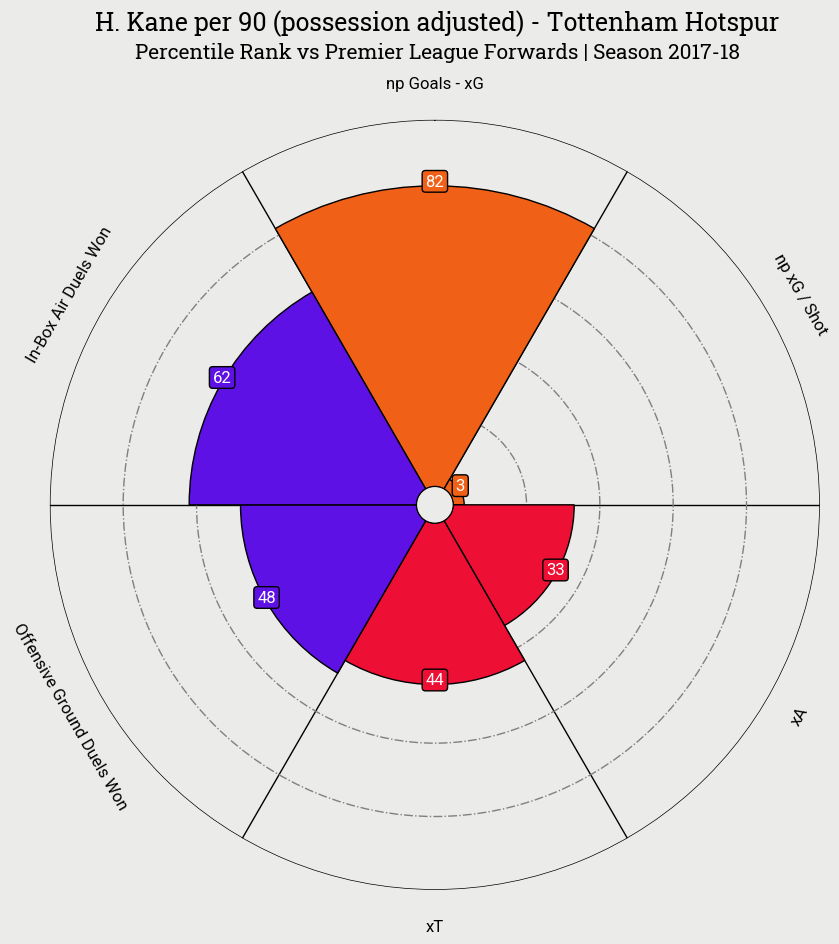

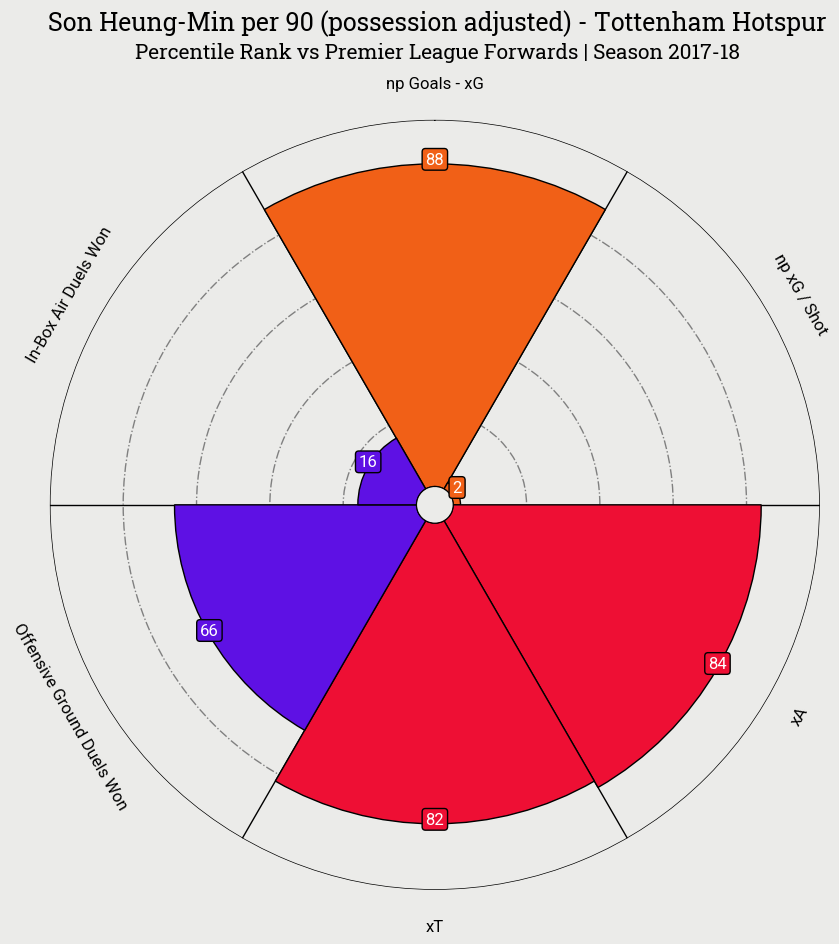

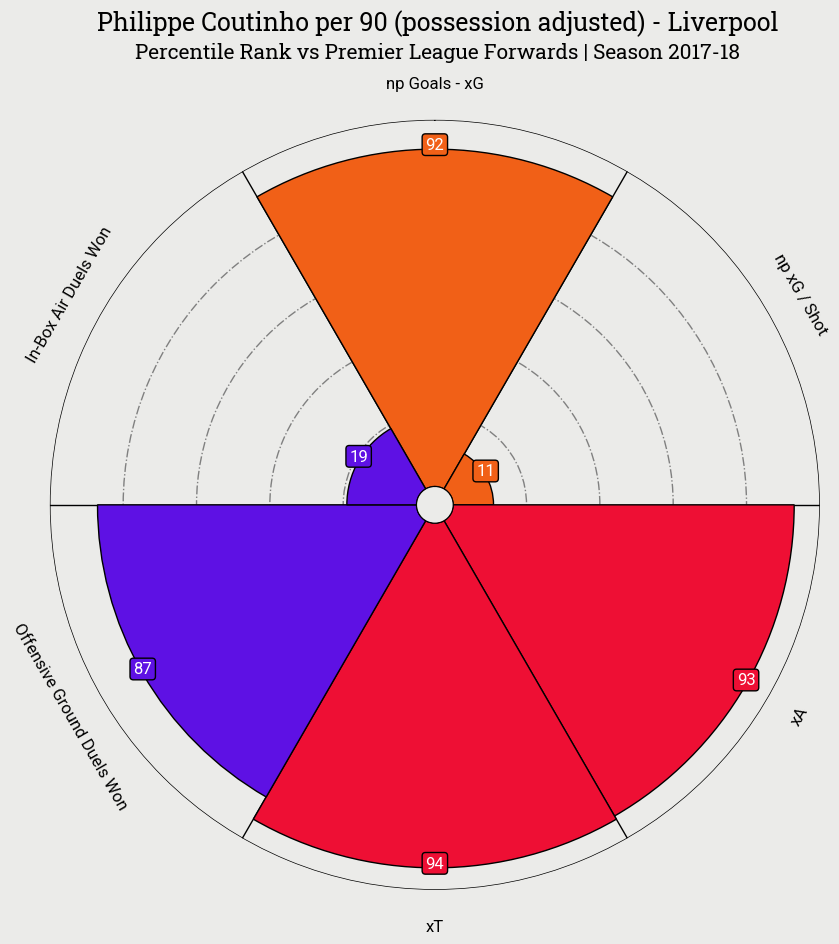

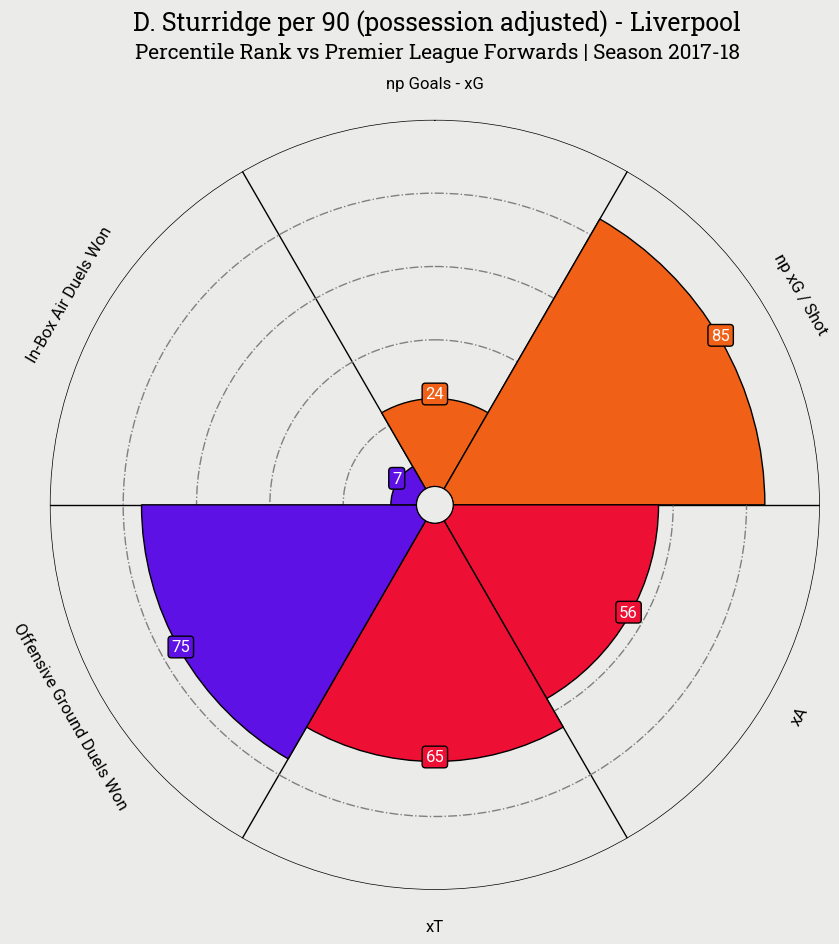

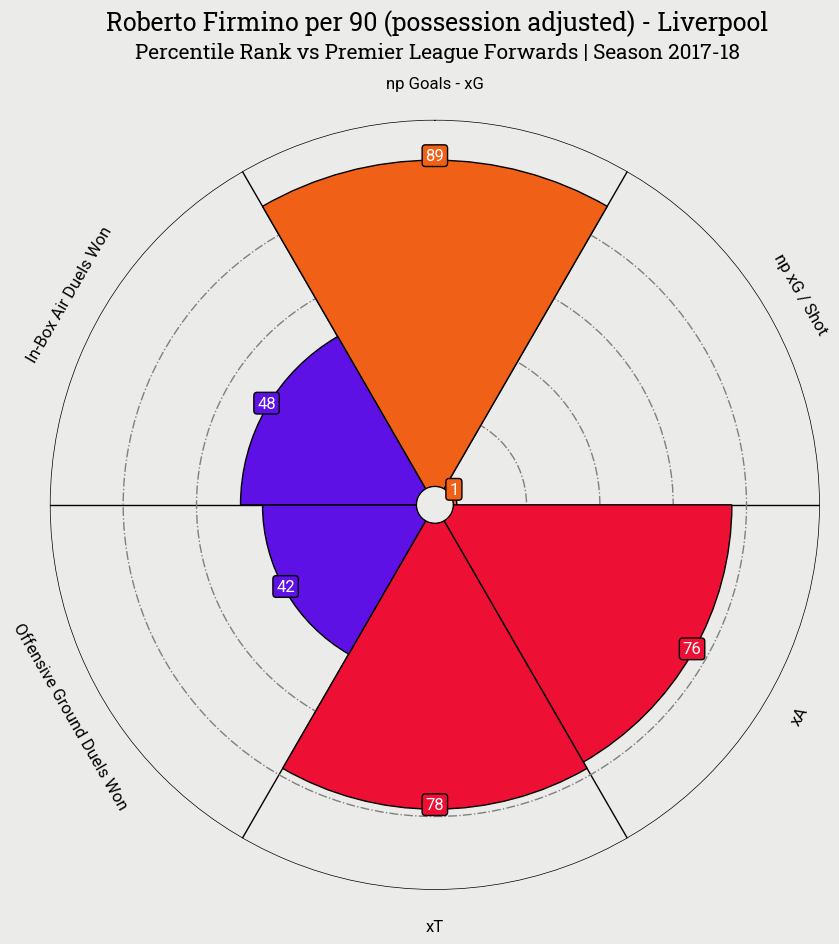

...

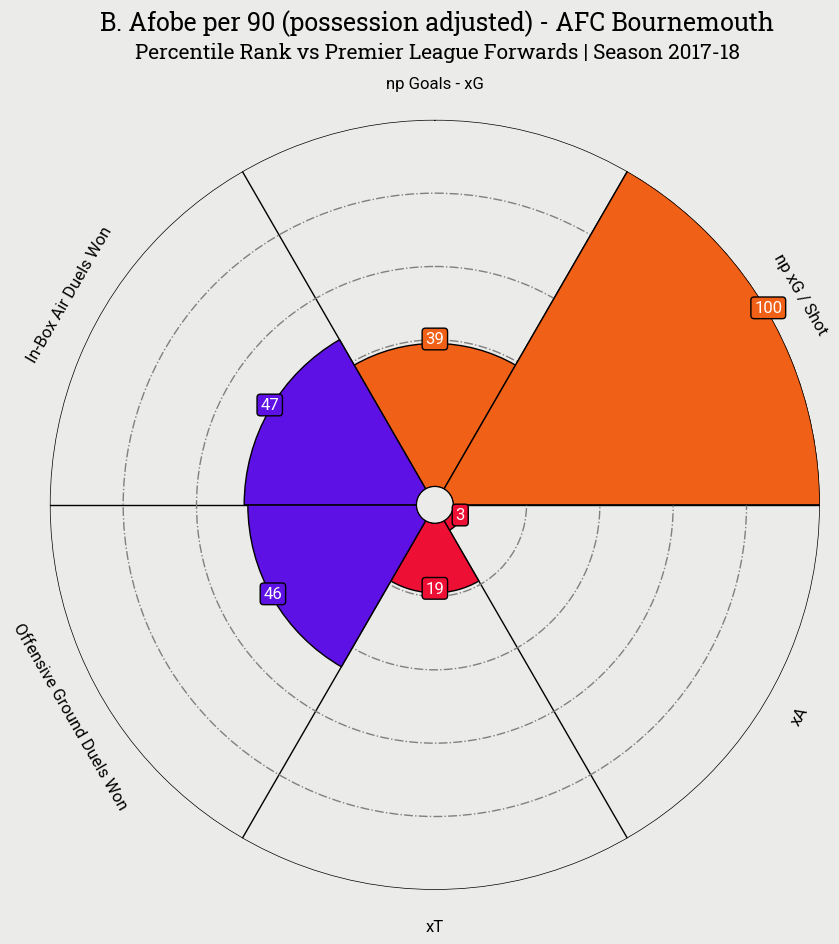

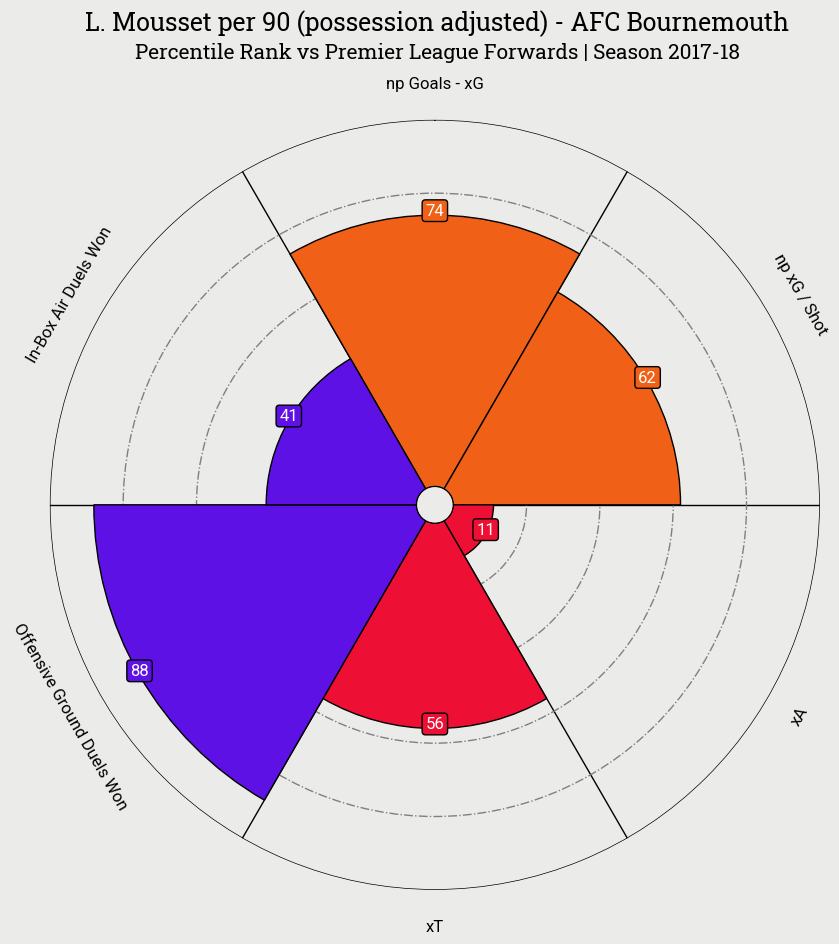

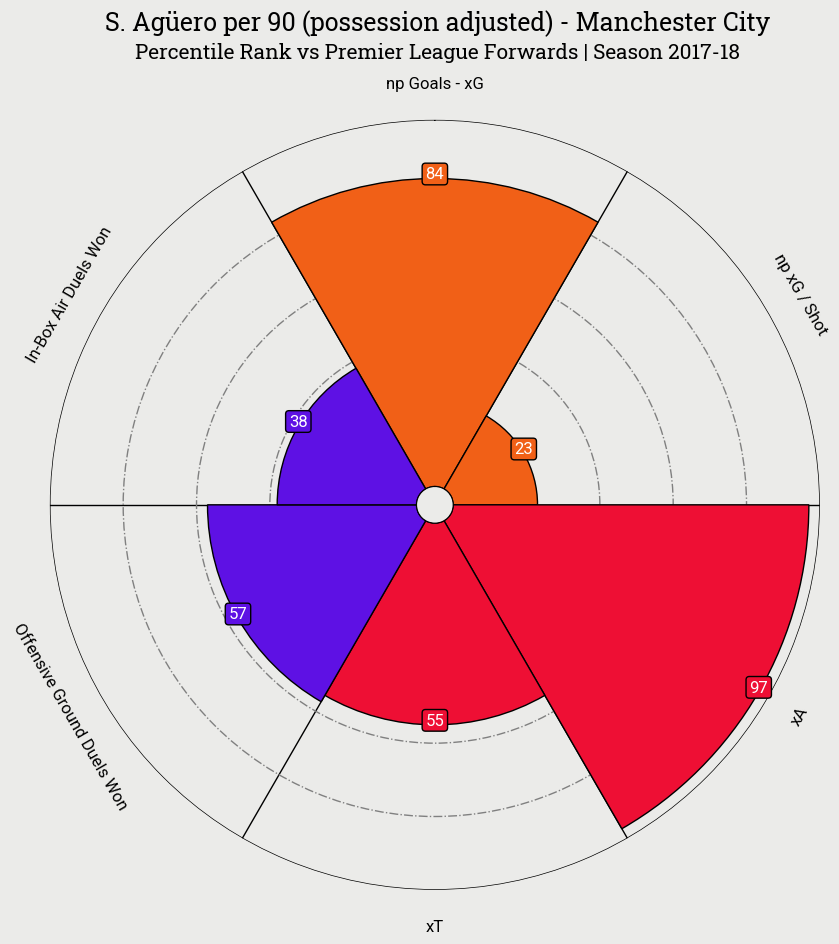

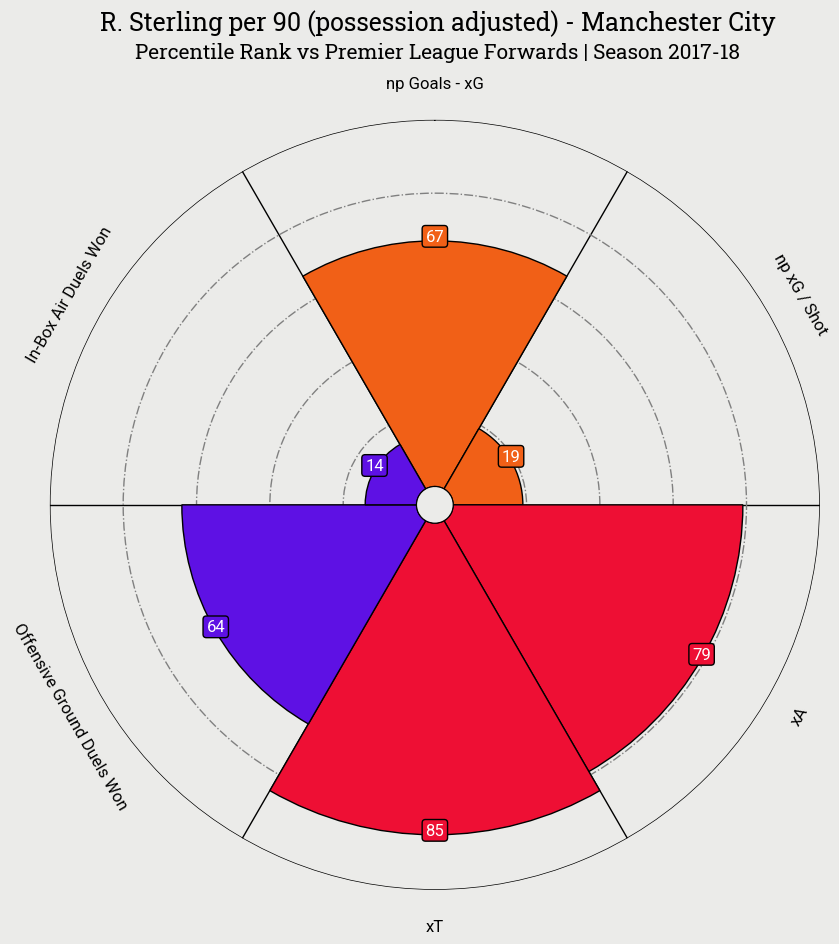

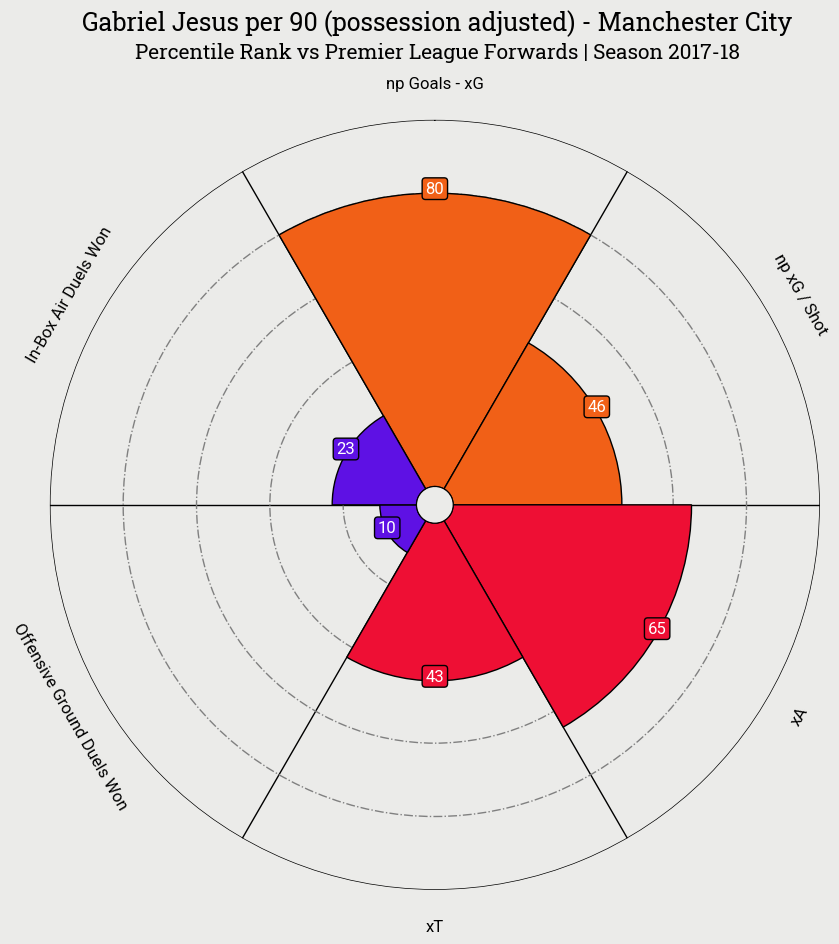

In [34]:
for player in role_summary_adjusted_w_birthdate.playerId.unique():
    player_summary = role_summary_adjusted_w_birthdate[role_summary_adjusted_w_birthdate.playerId == player].sort_values('teamId', ascending=False)
    plotPlayerPizza(player_summary, role_summary_adjusted_w_birthdate)

In [37]:
# If England, check only Chelsea players
# team_role_summary_adjusted = role_summary_adjusted_w_birthdate[role_summary_adjusted_w_birthdate["teamId"] == TEAM_ID]
# players_id = team_role_summary_adjusted.playerId
# players_summary = role_summary_adjusted_w_birthdate[role_summary_adjusted_w_birthdate.playerId.isin(players_id)].sort_values('teamId', ascending=False)
# players_summary

,playerId,shortName,teamId,teamName,roleName,shots_per90_adjusted,xT_per90_adjusted,xA_per90_adjusted,groundDuelsWon_per90_adjusted,airDuelsWon_per90_adjusted,goals_per90_adjusted,goals-npxG_per90_adjusted,npxGPerShot_per90_adjusted,birthDate,height,age
49,26010,O. Giroud,1610,Chelsea,Forward,6.156678,1.145642,0.162163,5.417877,3.940274,0.738801,-0.110135,0.033957,1986-09-30,192,31
50,3324,Álvaro Morata,1610,Chelsea,Forward,5.548273,1.010148,0.122494,12.746032,1.049673,0.824743,0.039846,0.010607,1992-10-23,189,25
51,3360,Pedro,1610,Chelsea,Forward,5.363892,1.415784,0.120486,9.237813,0.000000,0.397325,-0.026296,0.007845,1987-07-28,167,31
52,25707,E. Hazard,1610,Chelsea,Forward,4.094089,2.640318,0.290268,23.904199,0.000000,0.660337,0.256803,0.006509,1991-01-07,173,27
48,26010,O. Giroud,1609,Arsenal,Forward,5.501940,1.042671,0.075920,2.912792,2.265505,1.294574,0.407355,0.052189,1986-09-30,192,31


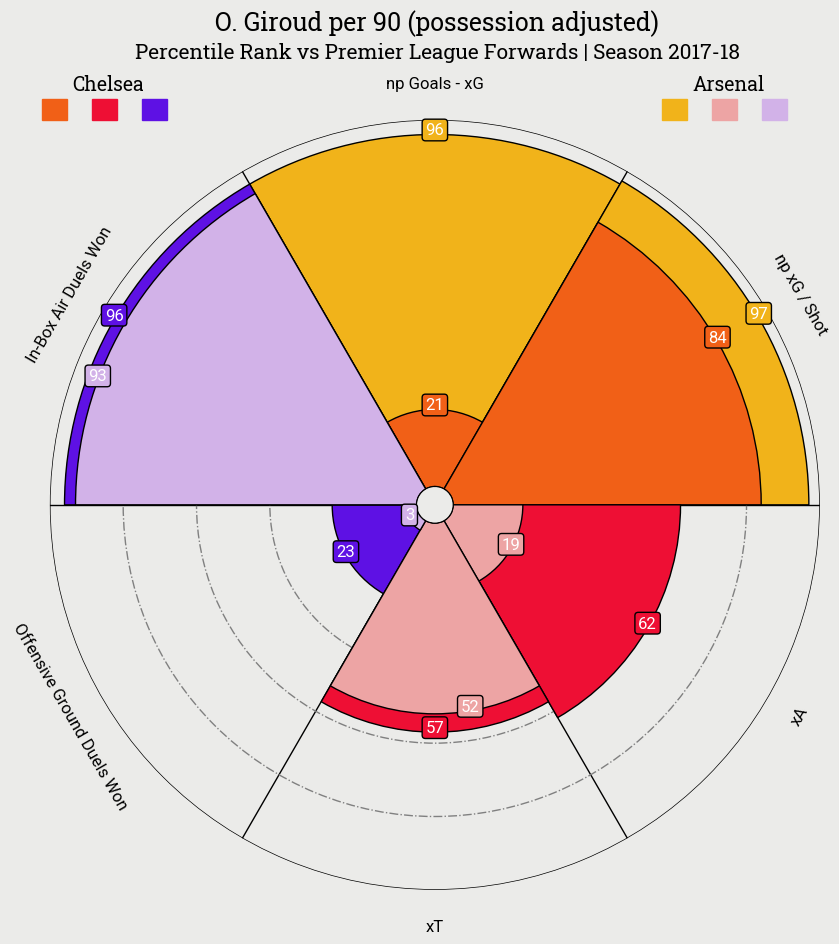

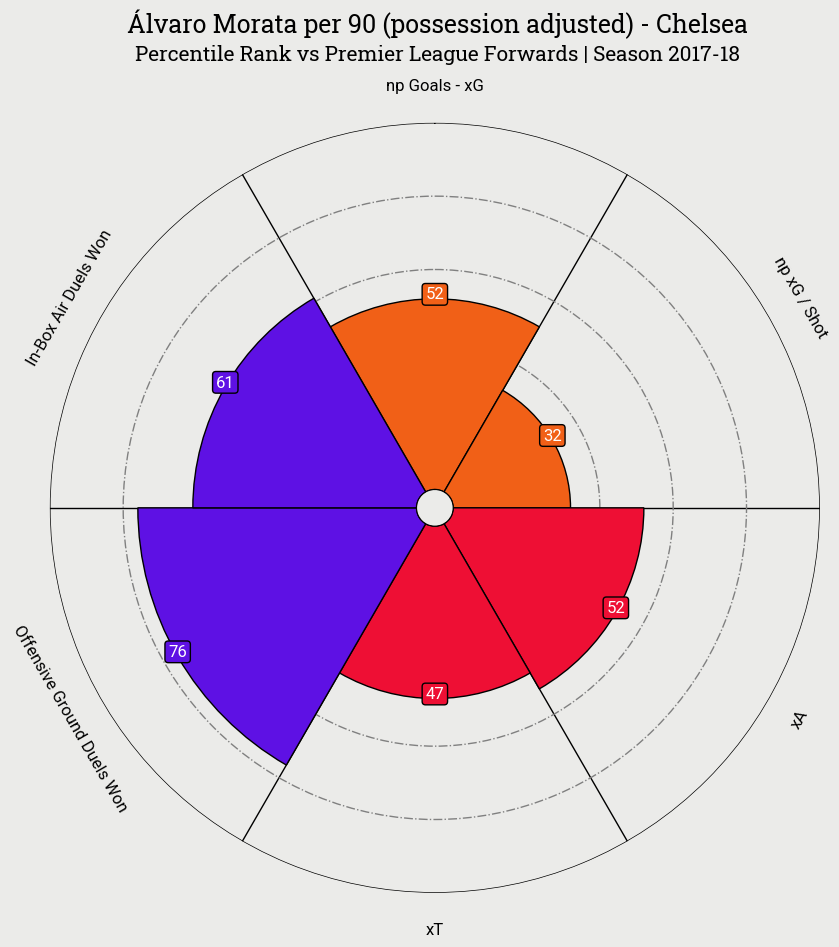

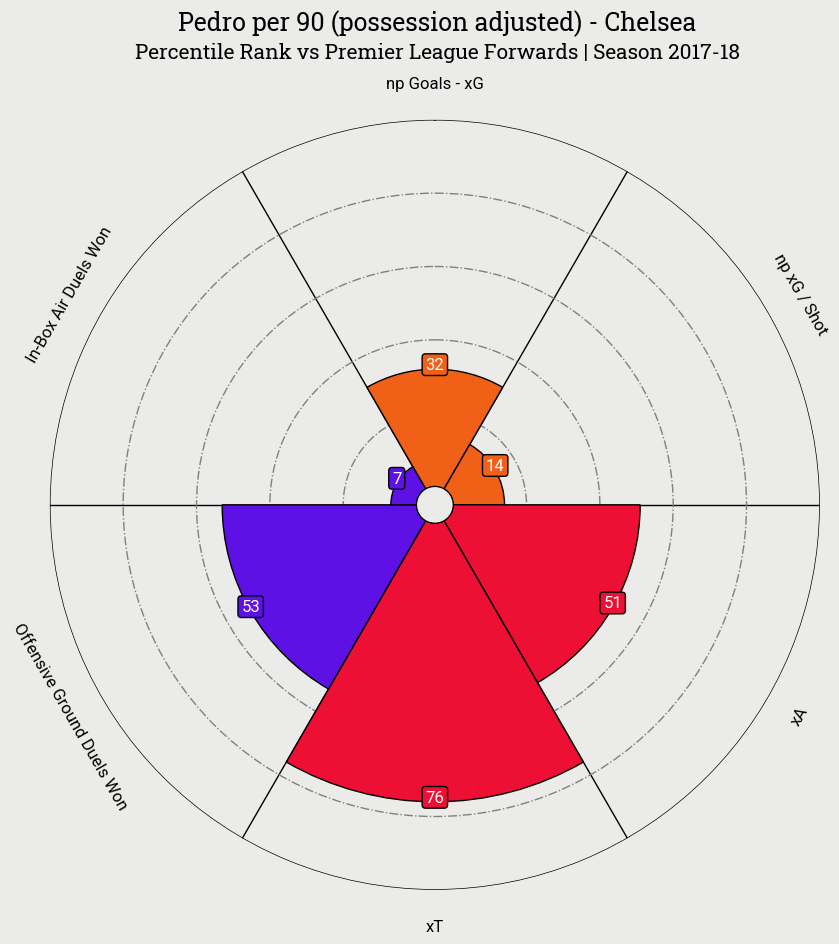

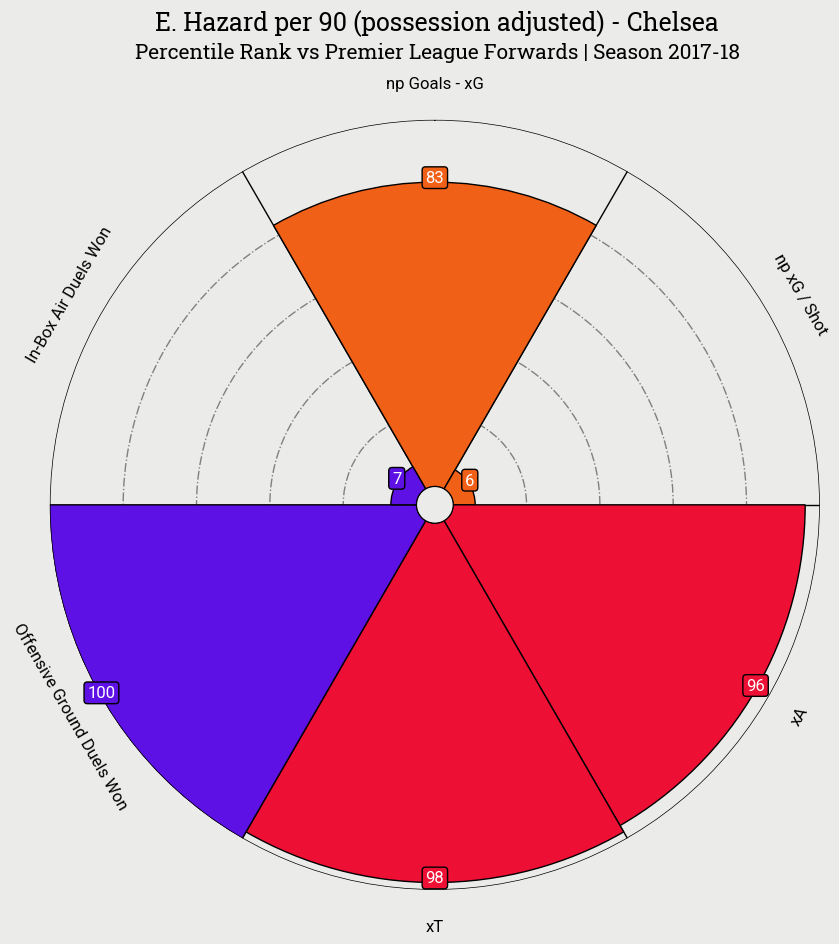

In [38]:
# for player in players_summary.playerId.unique():
#     player_summary = players_summary[players_summary.playerId == player]
#     plotPlayerPizza(player_summary, role_summary_adjusted_w_birthdate)